## Generating Phase diagrams with varying paramaters

This notebook shows how to generate the phase-diagrams for protein while varying each parameter over a defined interval. 

In [2]:
## Import all the packages here 

from biocrnpyler import *
from bioscrape.types import Model
from bioscrape.simulator import py_simulate_model

import pandas as pd
import numpy as np
from Parameters import Parameters # function to generate Parameters object with defined bounds
from matplotlib import style
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "arial"
%config InlineBackend.figure_format = 'retina'

style.use("default")

%matplotlib inline

In [3]:
## Import the model and define the timescale 

model_degtag = Model(sbml_filename = 'Biocrnpyler_model_degtag_070824.xml')
model_no_tag = Model(sbml_filename = 'Biocrnpyler_model_no_degtag_070824.xml')

N_steps = 1000
t_final = 1000
timepoints = np.linspace(0, t_final, N_steps)

tf_I = 720  # Time till we want to plot the simulation 
tf_i = 72   # Index of the experimental data array till we want to plot the simulation

In [4]:
## Function to pass the parameters of the model 

def run_CRN_model(param, model_degtag, model_no_tag, timepoints): 

    params = param.to_dict() # params is a Parameters object so values of parameters are extracted as a dictinory 

    Ribo_min = params['Ribo_min']

    tRNA_min = params['tRNA_min']
    
    RNAP_min = params['RNAP_min']

    Et_min = params['Et_min']

    protease_min = params['protease_min']
    
    n = 5.5 # Fixed parameter

    model_degtag.set_species({'dna_X': 100,
    'protein_RNAP_machinery': params['RNAP_IC'],
    'protein_sigma_machinery': params['Sigma_IC'],
    'protein_NT_units': params['NT_IC'],
    'protein_Ribo_machinery': params['Ribo_IC'],
    'protein_AA_units0tl': params['AA_IC'],
    'protein_tRNA_machinery': params['tRNA_IC'],
    'protein_RNAase_machinery': params['RNAase_IC'],
    'protein_Et_machinery': params['Et_IC'],
    'protein_protease_machinery': params['protease_IC'],
    'protein_unfolded_protein_degtag': 0,
    'rna_T_X':0,
    'protein_X':0,
    'cell_count_count': 6666666.67})

    model_no_tag.set_species({'dna_X': 100,
    'protein_RNAP_machinery': params['RNAP_IC'],
    'protein_sigma_machinery': params['Sigma_IC'],
    'protein_NT_units': params['NT_IC'],
    'protein_Ribo_machinery': params['Ribo_IC'],
    'protein_AA_units0tl': params['AA_IC'],
    'protein_tRNA_machinery': params['tRNA_IC'],
    'protein_RNAase_machinery': params['RNAase_IC'],
    'protein_Et_machinery': params['Et_IC'],
    'protein_protease_machinery': params['protease_IC'],
    'protein_unfolded_protein_degtag': 0,
    'rna_T_X':0,
    'protein_X':0,
    'cell_count_count': 6666666.67})

    model_degtag.set_params({'k__logistic_cell_growth': params['k_gr'], 
    'c_max__logistic_cell_growth': params['C_max'],
    'k_rnap__bacterial_transcription':params['k_RNAP'],
    'rnap_min__bacterial_transcription': RNAP_min,
    'k_ribo__bacterial_translation':params['k_Ribo'],
    'ribo_min__bacterial_translation': Ribo_min,
    'k_tRNA__bacterial_translation':params['k_tRNA'],
    'tRNA_min__bacterial_translation': tRNA_min,
    'k_Et__bacterial_translation':params['k_Et'],
    'Et_min__bacterial_translation': Et_min,
    'k_protease__bacterial_translation':params['k_protease'],
    'protease_min__bacterial_translation': protease_min,

    'k_tx_1b__bacterial_transcription':params['k_tx_1b'],
    'k_tx_1u__bacterial_transcription':params['k_tx_1u'],
    'k_tx_2u__bacterial_transcription':params['k_tx_2u'],
    'k_tx_2b__bacterial_transcription':params['k_tx_2b'],
    'k_tx_3__bacterial_transcription': params['k_tx_3'],
    'k_tx_4b__':params['k_tx_4b'],
    'k_tx_4u__':params['k_tx_4u'],
    'k_tx_5__': params['k_tx_5'],

    'k_tl_1b__bacterial_translation':params['k_tl_1b'],
    'k_tl_1u__bacterial_translation':params['k_tl_1u'],
    'k_tl_2__bacterial_translation':params['k_tl_2'],
    'k_tl_3__bacterial_translation':params['k_tl_3'],
    'k_tl_4__bacterial_translation':params['k_tl_4'],
    'k_tl_5__bacterial_translation':params['k_tl_5'],
    'k_tl_6b__bacterial_translation':params['k_tl_6b'],
    'k_tl_6u__bacterial_translation':params['k_tl_6u'],
    'k_tl_7__bacterial_translation':params['k_tl_7'],
    'b_tl_7__bacterial_translation':params['b_tl_7'],
    'k_tl_8__bacterial_translation':params['k_tl_8'],
    'P_max__bacterial_translation':params['P_max'],
    'b_tl_8__bacterial_translation':params['b_tl_8'],
    'k_tl_9__': params['k_tl_9'],
    'k_tl_10__': params['k_tl_10'],
    'k_tl_11__': params['k_tl_11'],
    'k_tl_12__bacterial_translation': params['k_tl_12'],
    'k_tl_13b__':params['k_tl_13b'],
    'k_tl_13u__':params['k_tl_13u'],
    'n__': n, 
    'n__mrna_degradation': n})

    model_no_tag.set_params({'k__logistic_cell_growth': params['k_gr'], 
    'c_max__logistic_cell_growth': params['C_max'],
    'k_rnap__bacterial_transcription':params['k_RNAP'],
    'rnap_min__bacterial_transcription': RNAP_min,
    'k_ribo__bacterial_translation':params['k_Ribo'],
    'ribo_min__bacterial_translation': Ribo_min,
    'k_tRNA__bacterial_translation':params['k_tRNA'],
    'tRNA_min__bacterial_translation': tRNA_min,
    'k_Et__bacterial_translation':params['k_Et'],
    'Et_min__bacterial_translation': Et_min,

    'k_tx_1b__bacterial_transcription':params['k_tx_1b'],
    'k_tx_1u__bacterial_transcription':params['k_tx_1u'],
    'k_tx_2u__bacterial_transcription':params['k_tx_2u'],
    'k_tx_2b__bacterial_transcription':params['k_tx_2b'],
    'k_tx_3__bacterial_transcription': params['k_tx_3'],
    'k_tx_4b__':params['k_tx_4b'],
    'k_tx_4u__':params['k_tx_4u'],
    'k_tx_5__': params['k_tx_5'],

    'k_tl_1b__bacterial_translation':params['k_tl_1b'],
    'k_tl_1u__bacterial_translation':params['k_tl_1u'],
    'k_tl_2__bacterial_translation':params['k_tl_2'],
    'k_tl_3__bacterial_translation':params['k_tl_3'],
    'k_tl_4__bacterial_translation':params['k_tl_4'],
    'k_tl_5__bacterial_translation':params['k_tl_5'],
    'k_tl_6b__bacterial_translation':params['k_tl_6b'],
    'k_tl_6u__bacterial_translation':params['k_tl_6u'],
    'k_tl_7__bacterial_translation':params['k_tl_7'],
    'b_tl_7__bacterial_translation':params['b_tl_7'],
    'k_tl_8__bacterial_translation':params['k_tl_8'],
    'P_max__bacterial_translation':params['P_max'],
    'b_tl_8__bacterial_translation':params['b_tl_8'],
    #'k_tl_9__': params['k_tl_9'],
    'k_tl_10__': params['k_tl_10'],
    'k_tl_11__': params['k_tl_11'],
    'k_tl_12__bacterial_translation': params['k_tl_12'],
    'n__': n, 
    'n__mrna_degradation': n})

    sol_deg = py_simulate_model(timepoints = timepoints, Model = model_degtag)
    sol_no_deg = py_simulate_model(timepoints = timepoints, Model = model_no_tag)

    return sol_deg, sol_no_deg

In [5]:
# Load the parameter file 
p = pd.read_csv('model_param_file_070824.csv').to_numpy()
p = p[:,2]

# Function that takes in an array and assigns the parameter values using the Parameters object 
# useful function when we want to define a new parameter array for each iteration of parameter variation

def set_params(p):

    params = Parameters()

    params.add_parameter(name = 'k_RNAP', value = p[0]*1, min_bound = 0.014*0.33*0, max_bound = 0.015*3.33)
    params.add_parameter(name = 'k_Ribo', value = p[1]*1, min_bound = 0.014*0.33*0, max_bound = 0.015*3.33)
    params.add_parameter(name = 'k_tRNA', value = p[2]*1 , min_bound = 0.014*0.3*0, max_bound = 0.015*3.33)
    params.add_parameter(name = 'k_Et', value = p[3]*1, min_bound = 0.014*0.33*0, max_bound = 0.021)
    params.add_parameter(name = 'k_protease', value = p[4]*1, min_bound = 0.014*0.33*0, max_bound = 0.015*3.33)

    params.add_parameter(name = "Sigma_IC", value = p[5]*1, min_bound = 150, max_bound = 1000)
    params.add_parameter(name = "RNAP_IC", value = p[6]*1, min_bound = 200, max_bound = 1000)
    params.add_parameter(name = "NT_IC", value = p[7]*1, min_bound = 10, max_bound = 1000)
    params.add_parameter(name = "RNAase_IC", value = p[8]*1, min_bound = 10, max_bound = 1000)
    params.add_parameter(name = "Et_IC", value = p[9]*1, min_bound = 250, max_bound = 600)
    params.add_parameter(name = "AA_IC", value = p[10]*1, min_bound = 300, max_bound = 50000)
    params.add_parameter(name = "tRNA_IC", value = p[11]*1, min_bound = 155, max_bound = 900)
    params.add_parameter(name = "Ribo_IC", value = p[12]*1, min_bound = 250, max_bound = 900)
    params.add_parameter(name = "protease_IC", value = p[13]*1, min_bound = 250, max_bound = 900)

    params.add_parameter(name = "Ribo_min", value = p[14]*1, min_bound = 100, max_bound = 250)
    params.add_parameter(name = "tRNA_min", value = p[15]*1, min_bound = 100, max_bound = 155)
    params.add_parameter(name = "RNAP_min", value = p[16]*1, min_bound = 100, max_bound = 200)
    params.add_parameter(name = "Et_min", value = p[17]*1, min_bound = 100, max_bound = 250)
    params.add_parameter(name = "protease_min", value = p[18]*1, min_bound = 100, max_bound = 250)

    k_tx_1b = 0.0371*1
    k_tx_2u = 0.097*2

    params.add_parameter(name = 'k_tx_1b', value = p[19]*1, min_bound = 1*1e-3, max_bound = 1*1e-1)
    params.add_parameter(name = 'k_tx_1b', value = p[19]*1, min_bound = 1*1e-3, max_bound = 1*1e-1)
    params.add_parameter(name = 'k_tx_1u', value = p[20], min_bound = k_tx_1b*100, max_bound = k_tx_1b*1000)
    params.add_parameter(name = 'k_tx_2b', value = p[21]*1 , min_bound = k_tx_2u/1000, max_bound= k_tx_2u/100)
    params.add_parameter(name = 'k_tx_2u', value = p[22]*1, min_bound = 0.01, max_bound = 0.1)
    params.add_parameter(name = 'k_tx_3', value = p[23]*1, min_bound = 0.001, max_bound = 0.0036)
    params.add_parameter(name = 'k_tx_4b', value = p[24], min_bound = 0.1, max_bound = 5)
    params.add_parameter(name = 'k_tx_4u', value = p[25]*1, min_bound = 100, max_bound = 200)
    params.add_parameter(name = 'k_tx_5', value = p[26]*1, min_bound = 0.1, max_bound = 10)

    params.add_parameter(name = 'k_tl_1b', value = p[27], min_bound = 0.03*0.33, max_bound = 0.3*3.33)
    params.add_parameter(name = 'k_tl_1u', value = p[28], min_bound = 2.1e4*0.33, max_bound = 2.1e4*3.33)
    params.add_parameter(name = 'k_tl_2', value = p[29], min_bound = 1.2e+04*0.33, max_bound = 1.2e+04*3.33)
    params.add_parameter(name = 'k_tl_3', value = p[30], min_bound = 3*0.33, max_bound = 3*3.33)
    params.add_parameter(name = 'k_tl_4', value = p[31], min_bound = 8.22e+02*0.33, max_bound = 8.22e+02*3.33)
    params.add_parameter(name = 'k_tl_5', value = p[32], min_bound = 101.1*0.33, max_bound = 101.1*3.33)
    params.add_parameter(name = 'k_tl_6b', value = p[33]*1, min_bound = 1.8e-3*0.33, max_bound = 1.8e-3*3.33)
    params.add_parameter(name = 'k_tl_6u', value = p[34]*1, min_bound = 6.0e+02*0.33, max_bound = 6.0e+02*3.33)
    params.add_parameter(name = 'k_tl_7', value = p[35]*1, min_bound = 1.6, max_bound = 4.25)
    params.add_parameter(name = 'k_tl_8', value = p[36]*1, min_bound = 0.1, max_bound = 0.2)
    params.add_parameter(name = "b_tl_8", value = p[37]*1, min_bound = 0.5, max_bound = 1)
    params.add_parameter(name = 'k_tl_9', value = p[38]*1, min_bound = 0.05, max_bound = 10)
    params.add_parameter(name = 'b_tl_7', value = p[39]*1, min_bound = 0.4, max_bound = 1.5)
    params.add_parameter(name = 'k_tl_10', value = p[40]*1, min_bound = 0.0005, max_bound = 0.01)
    params.add_parameter(name = 'k_tl_11', value = p[41]*1, min_bound = 0.0005, max_bound = 0.1)
    params.add_parameter(name = 'k_tl_12', value = p[42]*1, min_bound = 10, max_bound = 1e3)
    params.add_parameter(name = 'k_tl_13b', value = p[43]*1, min_bound = 0.1, max_bound = 10)
    params.add_parameter(name = 'k_tl_13u', value = p[44]*1, min_bound = 50, max_bound = 100000)
    params.add_parameter(name = 'P_max', value = p[45]*1, min_bound = 1e3, max_bound = 1e6)

    params.add_parameter(name = 'C_max', value = p[46])
    params.add_parameter(name = "C_0", value = p[47])
    params.add_parameter(name = "k_gr", value = p[48])
        
    return params

params = set_params(p)
# Suppress warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sol_deg, sol_no_deg = run_CRN_model(params, model_degtag, model_no_tag, timepoints)


In [6]:
# Print all the parameters in the model to check 

param_dict = params.to_dict()
param_dict

{'k_RNAP': 0.0249642652969019,
 'k_Ribo': 0.005548096339222,
 'k_tRNA': 0.0109429462378743,
 'k_Et': 0.0209996901749884,
 'k_protease': 0.0160374903203296,
 'Sigma_IC': 977.6286766768188,
 'RNAP_IC': 200.69267140359847,
 'NT_IC': 962.8496894045344,
 'RNAase_IC': 71.9931563397171,
 'Et_IC': 562.9337943527621,
 'AA_IC': 49999.872974292106,
 'tRNA_IC': 580.366757975238,
 'Ribo_IC': 794.798520431711,
 'protease_IC': 252.5132422109901,
 'Ribo_min': 173.1507088013159,
 'tRNA_min': 106.41197082233286,
 'RNAP_min': 199.39800443544928,
 'Et_min': 160.80397095986172,
 'protease_min': 175.96514536463076,
 'k_tx_1b': 0.0506465896715939,
 'k_tx_1u': 13.659285573115495,
 'k_tx_2b': 0.000197944385967,
 'k_tx_2u': 0.0546170223132887,
 'k_tx_3': 0.0023233141592824,
 'k_tx_4b': 2.549716427004064,
 'k_tx_4u': 181.7275611488472,
 'k_tx_5': 1.8811047794696207,
 'k_tl_1b': 0.4530556941495391,
 'k_tl_1u': 69930.0,
 'k_tl_2': 39960.0,
 'k_tl_3': 9.957916186719975,
 'k_tl_4': 590.884399521651,
 'k_tl_5': 138.8

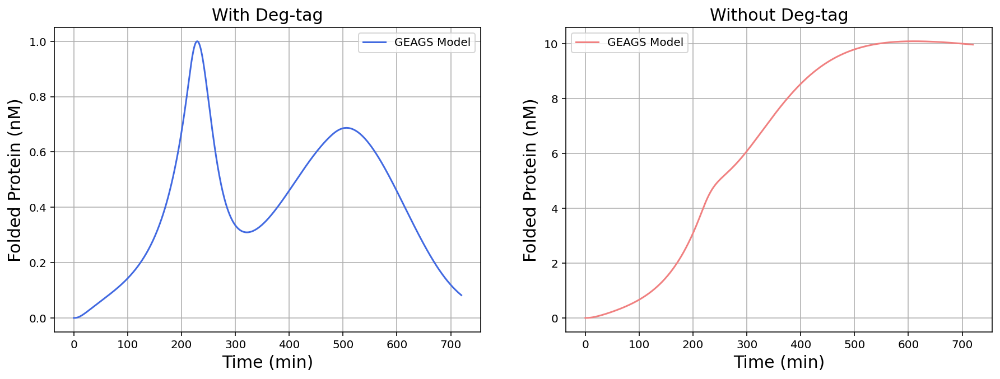

In [7]:
# Plot the initial model output to verify the parameters 

fig, ax = plt.subplots(1,2, figsize = (15,5))
fig.subplots_adjust(wspace = 0.2)#, hspace = 0.1)


i = 0
ax[i].plot(timepoints[:tf_I], sol_deg['protein_X'][:tf_I]/np.max(sol_deg['protein_X']), label = "GEAGS Model", color = 'royalblue')
ax[i].set_xlabel('Time (min)', fontsize = 15) ; ax[i].set_ylabel('Folded Protein (nM)', fontsize = 15) 
ax[i].set_title('With Deg-tag', fontsize = 15) ; ax[i].grid(True) ; ax[i].legend()

i = 1
ax[i].plot(timepoints[:tf_I], sol_no_deg['protein_X'][:tf_I]/np.max(sol_deg['protein_X']), label = "GEAGS Model", color = 'lightcoral')
ax[i].set_xlabel('Time (min)', fontsize = 15) ; ax[i].set_ylabel('Folded Protein (nM)', fontsize = 15) 
ax[i].set_title('Without Deg-tag', fontsize = 15) ; ax[i].grid(True) ; ax[i].legend()


### Plotting the phase diagrams: 
We can estimate the rate of change of protein concentration (dP/dt) from the simulation data using the numpy's gradient estimator function:

Text(0.5, 1.0, 'Without deg-tag')

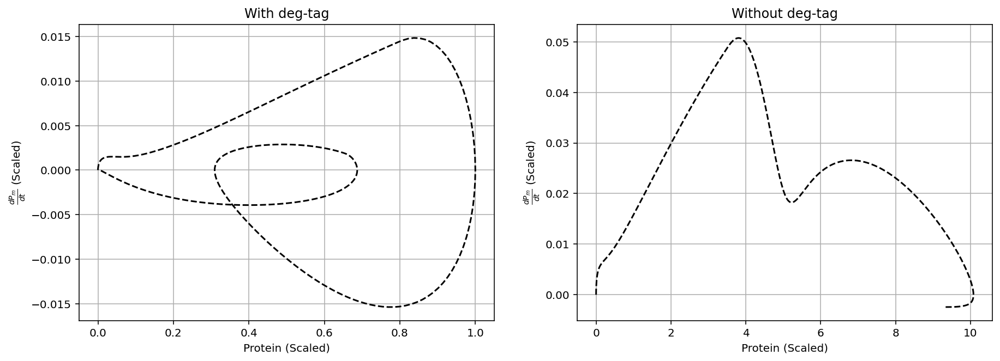

In [8]:
# estimate the gradient from the simulation data 
# Also, scale the protein concentration with the max conc of the deg-tagged protein to get a better 
# comparison of the dynamics when the aboslute conc of protein varies significantly 


dPmdt_deg_CRN = np.gradient(sol_deg['protein_X']/np.max(sol_deg['protein_X']))
dPmdt_no_deg_CRN = np.gradient(sol_no_deg['protein_X']/np.max(sol_deg['protein_X']))

fig, ax = plt.subplots(1,2, figsize = (15,5))
fig.subplots_adjust(wspace = 0.2)#, hspace = 0.8)
#fig, ax = plt.subplots(2,1, figsize = (8,12))

ax[0].plot(sol_deg['protein_X']/np.max(sol_deg['protein_X']),dPmdt_deg_CRN, '--', color = 'black')

ax[0].set_xlabel('Protein (Scaled)'); ax[0].set_ylabel(r'$\frac{dP_{m}}{dt}$ (Scaled)'); ax[0].grid(True) ; 
ax[0].set_title('With deg-tag')

ax[1].plot(sol_no_deg['protein_X']/np.max(sol_deg['protein_X']),dPmdt_no_deg_CRN, '--', color = 'black')

ax[1].set_xlabel('Protein (Scaled)'); ax[1].set_ylabel(r'$\frac{dP_{m}}{dt}$ (Scaled)'); ax[1].grid(True) ; 
ax[1].set_title('Without deg-tag')

### Introducing variation of parameters: 
Create an array of input parameters that are varied over a defined interval and defined number of variations, and pass them through the set_params function to generate model trajectories with the varied parameters

In [9]:
# Collect parameter names and units from dictionary to use them while plotting 

param_dict = params.to_dict()

param_names = np.array(list(param_dict.keys()))
param_array = np.array(list(param_dict.values()))
param_names

array(['k_RNAP', 'k_Ribo', 'k_tRNA', 'k_Et', 'k_protease', 'Sigma_IC',
       'RNAP_IC', 'NT_IC', 'RNAase_IC', 'Et_IC', 'AA_IC', 'tRNA_IC',
       'Ribo_IC', 'protease_IC', 'Ribo_min', 'tRNA_min', 'RNAP_min',
       'Et_min', 'protease_min', 'k_tx_1b', 'k_tx_1u', 'k_tx_2b',
       'k_tx_2u', 'k_tx_3', 'k_tx_4b', 'k_tx_4u', 'k_tx_5', 'k_tl_1b',
       'k_tl_1u', 'k_tl_2', 'k_tl_3', 'k_tl_4', 'k_tl_5', 'k_tl_6b',
       'k_tl_6u', 'k_tl_7', 'k_tl_8', 'b_tl_8', 'k_tl_9', 'b_tl_7',
       'k_tl_10', 'k_tl_11', 'k_tl_12', 'k_tl_13b', 'k_tl_13u', 'P_max',
       'C_max', 'C_0', 'k_gr'], dtype='<U12')

In [10]:
# Define the degree of variation we need to observe 

N = 5 # Number of of trajectories
interval = 0.5 # Uniform sampling done about interval of (p * (1-interval), p * (1+interval))
Np = len(param_array)
param_space_transpose = np.linspace((param_array * (1 - interval)), (param_array * (1 + interval)), N)
param_space = np.transpose(param_space_transpose)
np.shape(param_space)

(49, 5)

In [11]:
# Define the result array to store the results 

protein_deg_array = np.zeros((Np, N, N_steps))
protein_no_deg_array = np.zeros((Np, N, N_steps))

dPmdt_deg_array = np.zeros((Np, N, N_steps))
dPmdt_no_deg_array = np.zeros((Np, N, N_steps))

In [12]:
# Generate the profiles with range of parameters
for j in range(Np):
    for i in range(N):
        
        param_i = [param_array[index] for index in range(len(param_array))]
        param_i[j] = param_space[j,i]
        param_new = set_params(param_i)

        # Suppress warnings
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")

            sol_deg_new, sol_no_deg_new = run_CRN_model(param_new, model_degtag, model_no_tag, timepoints)

        protein_deg_array[j,i,:] = sol_deg_new['protein_X']/np.max(sol_deg_new['protein_X'])
        protein_no_deg_array[j,i,:] = sol_no_deg_new['protein_X']/np.max(sol_deg_new['protein_X'])

        dPmdt_deg = np.gradient(sol_deg_new['protein_X'])/np.max(sol_deg_new['protein_X']) 
        dPmdt_no_deg = np.gradient(sol_no_deg_new['protein_X'])/np.max(sol_deg_new['protein_X']) 

        dPmdt_deg_array[j,i,:] = dPmdt_deg
        dPmdt_no_deg_array[j,i,:] = dPmdt_no_deg

In [13]:
# Also another way to save the trajectories if we want to export them 

# np.save("protein_deg_array_50_percent.npy", protein_deg_array)
# np.save("protein_no_deg_array_50_percent.npy", protein_no_deg_array)

# np.save("dPmdt_deg_array_50_percent.npy", dPmdt_deg_array)
# np.save("dPmdt_no_deg_array_50_percent.npy", dPmdt_no_deg_array)

In [14]:
# Load the exported result array 
# protein_deg_array = np.load('protein_deg_array_50_percent.npy')
# protein_no_deg_array = np.load('protein_no_deg_array_50_percent.npy')

# dPmdt_deg_array = np.load('dPmdt_deg_array_50_percent.npy')
# dPmdt_no_deg_array = np.load('dPmdt_no_deg_array_50_percent.npy')

Text(0.5, 0.91, 'Phase portraits with variation of parameters with deg-tag ')

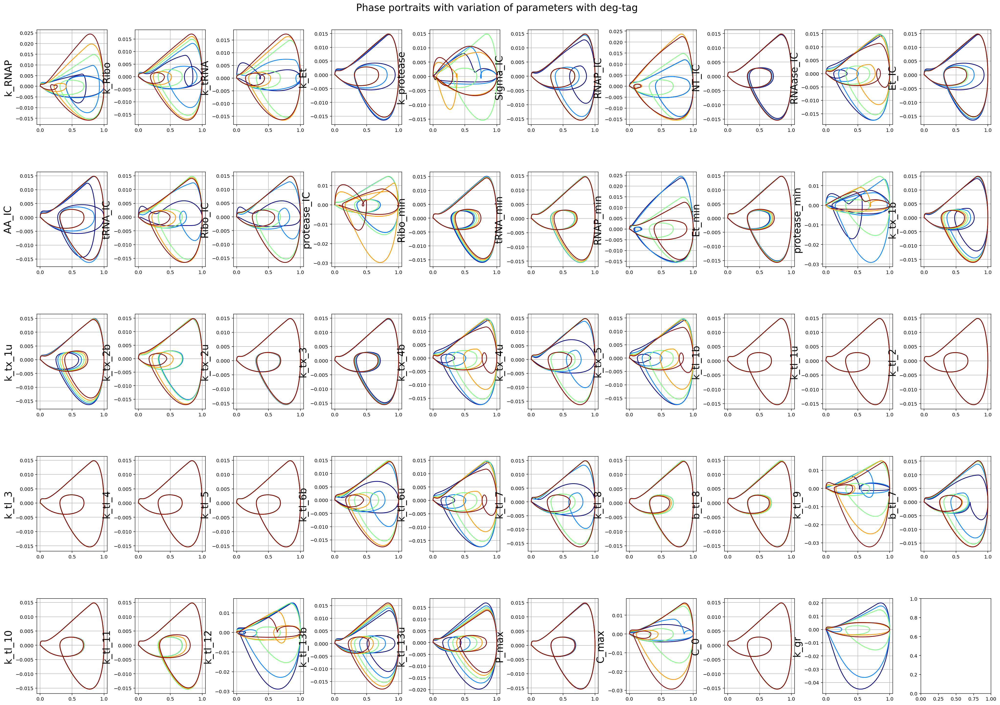

In [15]:
# Automate the plotting of all the phase diagrams 

n1 = 5 ; n2 = 10 ; 
fig, ax = plt.subplots(n1,n2, figsize = (35,25))
fig.subplots_adjust(wspace = 0.4, hspace = 0.5)

indices = [[l, k] for l in range(n1) for k in range(n2)]

# Create a colormap to generate a sequence of distinct colors
colormap = plt.cm.get_cmap('jet', N)

for j in range(Np):
    if j not in [49,50]:
        r,c = indices[j]
        for i in range(N):
            ax[r,c].plot(protein_deg_array[j,i,:], dPmdt_deg_array[j,i,:], color=colormap(i/N))
        #ax[r,c].set_xlabel('Units - '+param_units[j], fontsize = 20)
        ax[r,c].set_ylabel(param_names[j], fontsize = 20)
        ax[r,c].grid(True)
    else:
        pass

fig.suptitle('Phase portraits with variation of parameters with deg-tag ', fontsize = 20, y = 0.91)

Text(0.5, 0.91, 'Phase portraits with variation of parameters no deg-tag ')

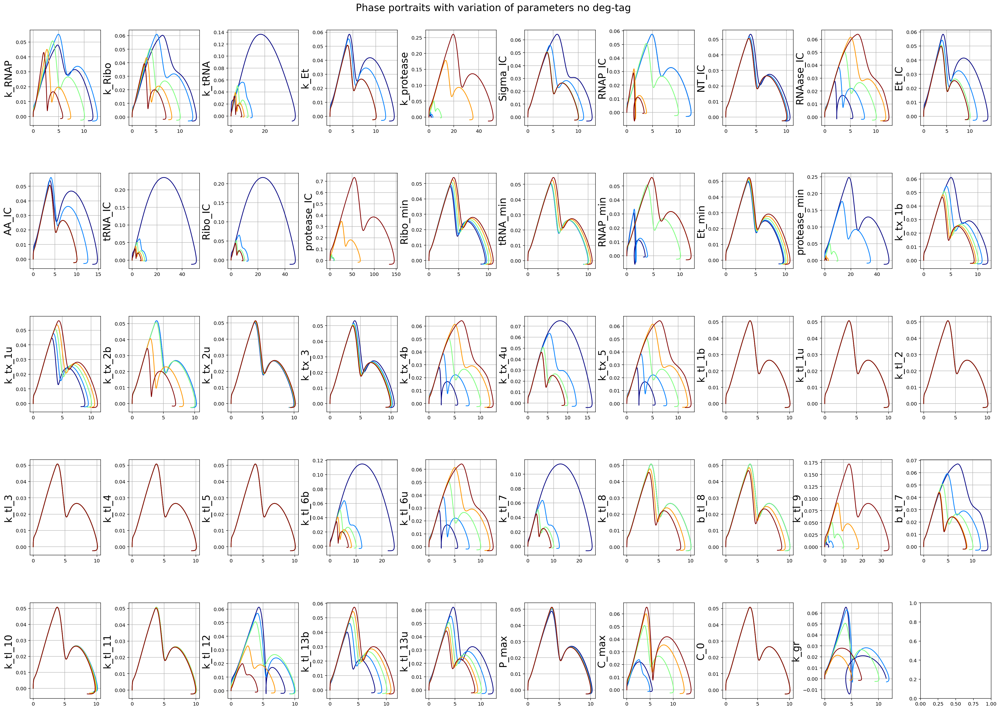

In [16]:
n1 = 5 ; n2 = 10 ; 
fig, ax = plt.subplots(n1,n2, figsize = (35,25))
fig.subplots_adjust(wspace = 0.4, hspace = 0.5)

indices = [[l, k] for l in range(n1) for k in range(n2)]

# Create a colormap to generate a sequence of distinct colors
colormap = plt.cm.get_cmap('jet', N)

for j in range(Np):
    if j not in [49,50]:
        r,c = indices[j]
        for i in range(N):
            ax[r,c].plot(protein_no_deg_array[j,i,:], dPmdt_no_deg_array[j,i,:], color=colormap(i/N))
        #ax[r,c].set_xlabel('Units - '+param_units[j], fontsize = 20)
        ax[r,c].set_ylabel(param_names[j], fontsize = 20)
        ax[r,c].grid(True)
    else:
        pass

fig.suptitle('Phase portraits with variation of parameters no deg-tag ', fontsize = 20, y = 0.91)

In [17]:
# Obtain all the indices of parameters for printing purposes

for i in range(len(param_array)):
    print(i, param_names[i])

0 k_RNAP
1 k_Ribo
2 k_tRNA
3 k_Et
4 k_protease
5 Sigma_IC
6 RNAP_IC
7 NT_IC
8 RNAase_IC
9 Et_IC
10 AA_IC
11 tRNA_IC
12 Ribo_IC
13 protease_IC
14 Ribo_min
15 tRNA_min
16 RNAP_min
17 Et_min
18 protease_min
19 k_tx_1b
20 k_tx_1u
21 k_tx_2b
22 k_tx_2u
23 k_tx_3
24 k_tx_4b
25 k_tx_4u
26 k_tx_5
27 k_tl_1b
28 k_tl_1u
29 k_tl_2
30 k_tl_3
31 k_tl_4
32 k_tl_5
33 k_tl_6b
34 k_tl_6u
35 k_tl_7
36 k_tl_8
37 b_tl_8
38 k_tl_9
39 b_tl_7
40 k_tl_10
41 k_tl_11
42 k_tl_12
43 k_tl_13b
44 k_tl_13u
45 P_max
46 C_max
47 C_0
48 k_gr


Parameters are divided into 3 categories: <br>
(1) Species related - ones that affect the total conc of species  <br>
(2) CRN related - ones that are rate constants of the CRN reactions  <br>
(3) Growth related - logistic growth parameters 

In [18]:
# Specify the indices of parameters that you want to analyze closely 

spec_ind_species = range(0,19)
spec_ind_CRN = range(19,46)
spec_ind_growth = range(46,49)

Text(0.5, 0.91, 'Phase portraits with variation of species-parameters with deg-tag')

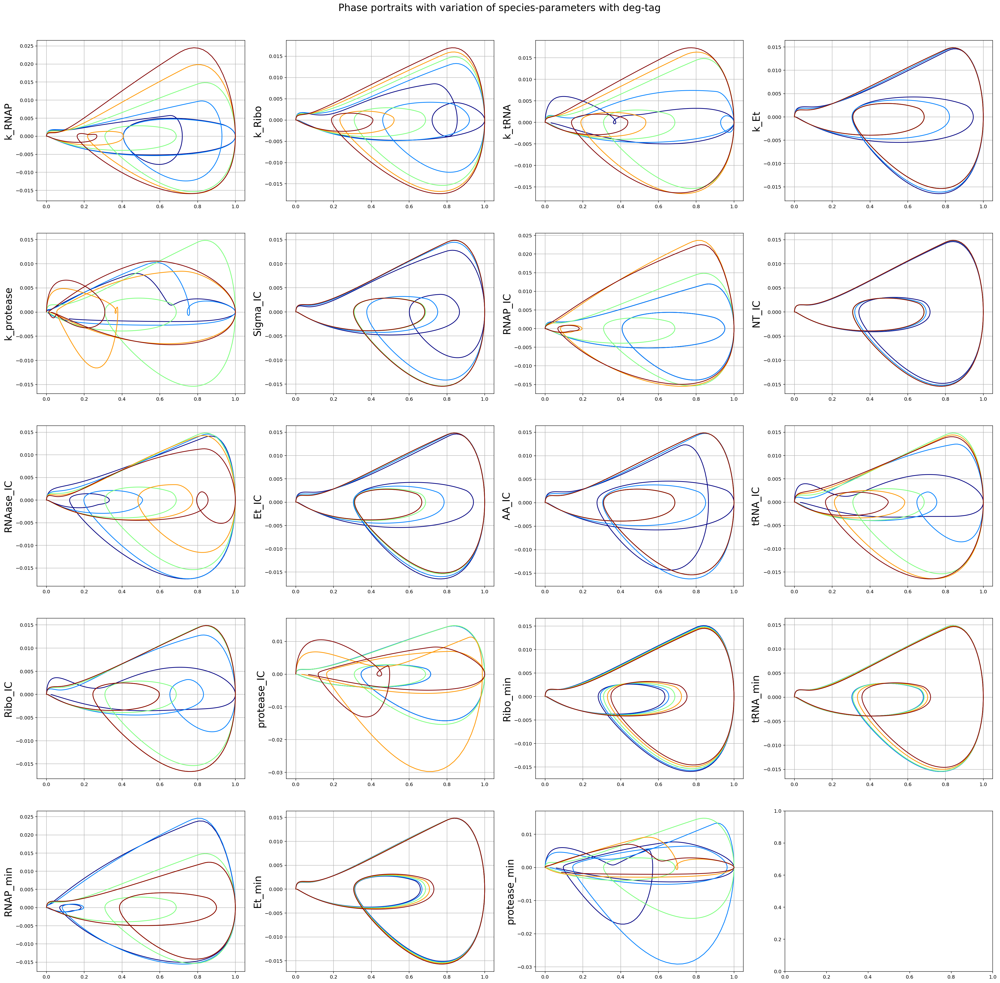

In [19]:
## Plot the species related parameters 

n1 = 5 ; n2 = 4 ; 
fig, ax = plt.subplots(n1,n2, figsize = (35,35))
fig.subplots_adjust(wspace = 0.2, hspace = 0.2)

indices = [[l, k] for l in range(n1) for k in range(n2)]

# Create a colormap to generate a sequence of distinct colors
colormap = plt.cm.get_cmap('jet', N)

for j in spec_ind_species:
    if j not in [19,20]:
        r,c = indices[j]
        for i in range(N):
            ax[r,c].plot(protein_deg_array[j,i,:], dPmdt_deg_array[j,i,:], color=colormap(i/N))
        #ax[r,c].set_xlabel('Units - '+param_units[j], fontsize = 20)
        ax[r,c].set_ylabel(param_names[j], fontsize = 20)
        ax[r,c].grid(True)
    else:
        pass

fig.suptitle('Phase portraits with variation of species-parameters with deg-tag', fontsize = 20, y = 0.91)

Text(0.5, 0.91, 'Phase portraits with variation of CRN-parameters with deg-tag ')

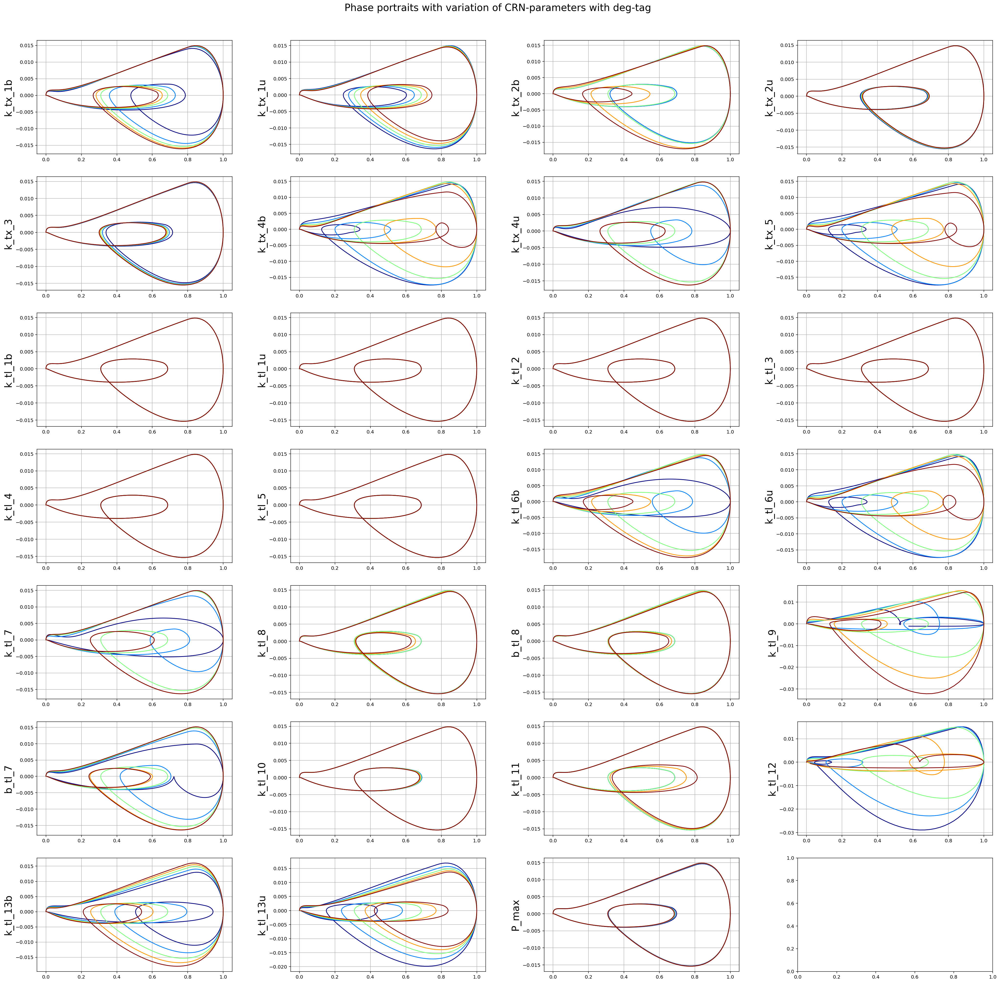

In [20]:
## Plot the CRN related parameters 

n1 = 7 ; n2 = 4 ; 
fig, ax = plt.subplots(n1,n2, figsize = (35,35))
fig.subplots_adjust(wspace = 0.3, hspace = 0.2)

indices = [[l, k] for l in range(n1) for k in range(n2)]

# Create a colormap to generate a sequence of distinct colors
colormap = plt.cm.get_cmap('jet', N)

for j in spec_ind_CRN:
    if j not in [46]:
        r,c = indices[j - spec_ind_CRN[0]]
        for i in range(N):
            ax[r,c].plot(protein_deg_array[j,i,:], dPmdt_deg_array[j,i,:], color=colormap(i/N))
        #ax[r,c].set_xlabel('Units - '+param_units[j], fontsize = 20)
        ax[r,c].set_ylabel(param_names[j], fontsize = 20)
        ax[r,c].grid(True)
    else:
        pass

fig.suptitle('Phase portraits with variation of CRN-parameters with deg-tag ', fontsize = 20, y = 0.91)

Text(0.5, 0.91, 'Phase portraits with variation of growth-parameters with deg-tag ')

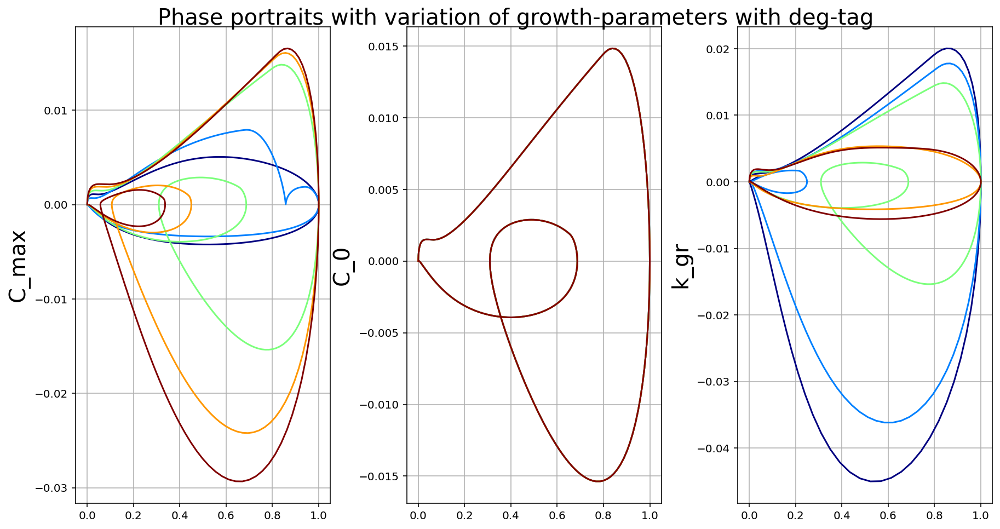

In [21]:
## Plot the growth related parameters 

n1 = 1 ; n2 = 3 ; 
fig, ax = plt.subplots(n1,n2, figsize = (15,8))
fig.subplots_adjust(wspace = 0.3, hspace = 0.2)

indices = [[l, k] for l in range(n1) for k in range(n2)]

# Create a colormap to generate a sequence of distinct colors
colormap = plt.cm.get_cmap('jet', N)

for j in spec_ind_growth:
    if j not in [49]:
        r,c = indices[j - spec_ind_growth[0]]
        for i in range(N):
            ax[c].plot(protein_deg_array[j,i,:], dPmdt_deg_array[j,i,:], color=colormap(i/N))
        #ax[r,c].set_xlabel('Units - '+param_units[j], fontsize = 20)
        ax[c].set_ylabel(param_names[j], fontsize = 20)
        ax[c].grid(True)
    else:
        pass

fig.suptitle('Phase portraits with variation of growth-parameters with deg-tag ', fontsize = 20, y = 0.91)

(array([-0.06, -0.04, -0.02,  0.  ,  0.02,  0.04]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

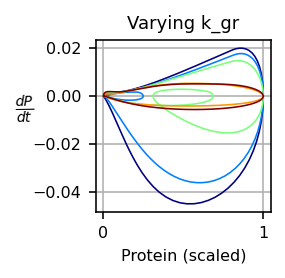

In [22]:
# Code to export high quality images 

mm = 1/2.54/10  # centimeters in inches
fig, axs = plt.subplots(1,1, figsize = (40 * mm, 40 * mm), sharex = 'col')

param_ind = 48  # look up the indice of wanted parameter

# Create a colormap to generate a sequence of distinct colors
colormap = plt.cm.get_cmap('jet', N)

lwd = 0.8

for i in range(N):
            axs.plot(protein_deg_array[param_ind,i,:], dPmdt_deg_array[param_ind,i,:], color = colormap(i/N), linewidth = lwd)

axs.grid(True)
axs.set_xlabel('Protein (scaled)', fontsize = 8)
axs.set_ylabel(r'$\frac{dP}{dt}$', rotation = 1, fontsize = 10)
axs.set_title('Varying ' + str(param_names[param_ind]), fontsize = 9)

plt.xticks(fontsize = 8) ; plt.yticks(fontsize = 8)

#fig.savefig(str(param_names[param_ind]) + '_variation.svg', dpi = 300)